# DeepSHAP

## Wyjaśnianie predykcji modelu przy pomocy algorytmów z rodziny Shap

Shap to zbiór metod pozwalających na lokalne wyjaśnienie wyników predykcji modelu. Lokalność oznacza w tym pzypadku analizowanie predykcji dla konkretnej próbki wejściowej, w odróżnieniu od prób zinterpretowania wewnętrznej wiedzy modelu. Nazwa metody pochodzi od znanych z teorii gier współczynników "Shap values", które opisują najbardziej sprawiedliwy podział nagrody uzyskanej w wyniku gry kooperacyjnej pomiędzy graczy biorących udział w grze - każdy otrzymuje odpowiednią część wygranej, zgodnie z poziomem kontrybucji do uzyskania nagrody.

W ogólnym założeniu podział nagrody między graczy opiera się o dwie kluczowe zasady:
- Additivity - suma nagród dla poszczególnych graczy jest równa nagrodzie całego zespołu
- Consistency - gracze mający większy wpływ na zysk zespołu nie powinni otrzymać nagrody mniejszej od graczy mniej wpływowych

Poniższa grafika demonstruje sposób, w jaki wylicza się analitycznie wartości Shapley'a w teorii gier:

<img src="shapley_values_theory.png" width="550"/>

W kontekście interpretowalności modeli machine learningowych, współczynniki Shapley'a są wykorzystywane są, aby obliczyć wpływ każdej cechy próbki wejściowej na wynik predykcji. Z technicznego punktu widzenia próbki traktowane są jako zespół graczy, gdzie każdy feature odpowiada jednemu graczowi. Intuicję stojącą za działaniem explainerów shap jasno przedstawia poniży wykres:

<img src="shapley_values_of_samples.png" width="550"/>

Przy wykorzystaniu Shap values w uczeniu maszynowym pojawiają się dwa znaczące problemy:
- Złożoność obliczeniowa - matematyczny model obliczeniowy zakłada rozpatrzenie wszystkich podzbiorów cech podczas obliczania współczynników Shapley'a dla pojedynczej próbki. Nie jest to wielki problem jeśli pracujemy na danych o małej liczbie wymiarów. W przypadku obrazów, gdzie każda próbka składa się z tysięcy pikseli, rozpatrzenie każdego podzbioru byłoby zbyt czasochłonne, stąd korzysta się z technik aproksymacyjnych.
- Inferencja z wykorzystaniem podzbioru cech - klasyczne modele machine learningowe nie umożliwiają przeprowadzenia inferencji na częściowo pozbawionych cech próbkach. W praktyce podchodzi się do tego problemu poprzez zastąpienie brakujących cech wartościami neutralnymi. Wyznaczenie wartości neutralnych jest problemem specyficznym dla konkretnego zadania i nie istnieje ogólny algorytm do ich uzyskania.

Typowe wartości neutralne:
- mediana/średnia całego zbioru danych
- wartość zerowa
- losowe próbki ze zbioru treningowego
- próbki reprezentujące klastry

Więcej na temat teorii stojącej za algorytmami Shap oraz problemów wiążących się z obliczaniem współczynników w kontekście modeli ml'owych można dowiedzieć się z wykładu Adi Watzman dostępnego pod adresem https://youtu.be/0yXtdkIL3Xk

## Algorytmy dostarczane przez pakiet shap

W bibliotece shap znajduje się wiele algorytmów przeznaczonych do współpracy z różnymi modelami machine learningowymi.

- Linear Explainer - analitycznie oblicza dokładne wartości Shapley Values dla modeli liniowych
- Tree Explainer - oblicza Shapley Values dla drzew decyzyjnych i algorytmów pochodnych (np. random forest)
- Kernel Explainer - model agnostic explainer - przystosowany do działania z dowolnym modelem, próbkuje wybierane podzbiory cech
- Gradient Explainer - explainer dla sieci neuronowych, korzysta z idei Integrated Gradients
- Deep Explainer - explainer dla sieci neuronowych, bazuje na algorytmie DeepLIFT

W poniższym tutorialu używać będziemy algorytmu DeepExplainer.

In [35]:
import numpy as np
import shap
import tensorflow as tf
import matplotlib.pyplot as plt
import warnings
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import layers
from tensorflow import keras
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import confusion_matrix
from scipy.stats.mstats import gmean
from scipy.stats import hmean

warnings.filterwarnings('ignore')

## Ładowanie datasetu

In [2]:
data = tf.keras.datasets.cifar10.load_data()

In [3]:
train_data, test_data = data
X_train, y_train = train_data
X_test, y_test = test_data

y_train = y_train.flatten()
y_test = y_test.flatten()

X_train_prep = preprocess_input(X_train.copy())
X_test_prep = preprocess_input(X_test.copy())

X_train_prep.shape, X_test_prep.shape, y_train.shape, y_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3), (50000,), (10000,))

In [4]:
class_names = {
    0: 'airplane',
    1: 'automobile',
    2: 'bird',
    3: 'cat',
    4: 'deer',
    5: 'dog',
    6: 'frog',
    7: 'horse',
    8: 'ship',
    9: 'truck',
}

shap_labels = np.array([list(class_names.values())])

## Konfiguracja modelu sieci

In [5]:
input_shape = X_train[0].shape
num_classes = 10

model = keras.Sequential(
    [
        keras.Input(shape=input_shape),
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        # layers.Flatten(),
        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.4),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation="softmax"),
    ]
)

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 30, 30, 32)        896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 12, 12, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 10, 10, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 64)                0

In [6]:
model.load_weights('cifar_weights_custom.h5')
test_preds = model.predict(X_test_prep)
test_preds_classes = np.argmax(test_preds, axis=-1)
test_accuracy = np.mean(test_preds_classes == y_test)

print('test accuracy:', round(test_accuracy, 2))

test accuracy: 0.75


## Konstrukcja deep explainera

Tworzymy instancję explainera. W celu realizacji algorytmu DeepExplainer konieczny jest referencyjny backgroud reprezentujący neutralne wejście do modelu. Na jego podstawie algorytm determinuje wpływ każdego piksela na wynik predykcji. Biblioteka shap umożliwia podanie jako tła wycinka zbioru danych, na podstawie którego wyznacza oczekiwane wartości cech próbki neutralnej.

In [7]:
np.random.seed(20)
background = X_train_prep[np.random.choice(X_train_prep.shape[0], 100, replace=False)]
explainer = shap.DeepExplainer(model, background)

Using TensorFlow backend.


## Explaining przykładowej próbki

airplane:    	0.0
automobile:    	1.0
bird:    	0.0
cat:    	0.0
deer:    	0.0
dog:    	0.0
frog:    	0.0
horse:    	0.0
ship:    	0.0
truck:    	0.0


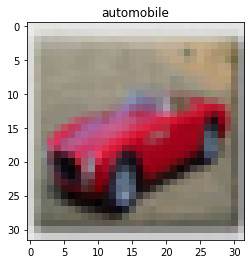

In [8]:
sample_idx = 1234
sample_img = X_test[sample_idx]
sample_img_prep = X_test_prep[sample_idx]

sample_label = y_test[sample_idx]
sample_pred = test_preds[sample_idx]

for i in range(10):
    rounded_pred = str(sample_pred[i].round(3))
    print(f'{class_names[i]}:    \t{rounded_pred}')
    
plt.imshow(sample_img)
plt.title(class_names[sample_label])
plt.show()

In [9]:
%%time
batch = sample_img_prep[np.newaxis, :]
batch_shap = explainer.shap_values(batch)
sample_img_shap = batch_shap[0]

CPU times: user 39 s, sys: 24 s, total: 1min 3s
Wall time: 16.9 s


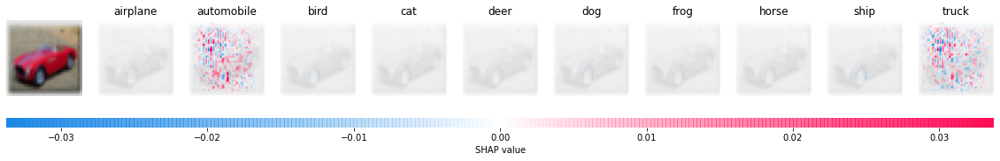

In [10]:
def prep_img(img):
    '''
    Funkcje pomocnicze w bibliotece shap odpowiedzialne za rysowanie wykresów 
    wymagają odpowiedniego formatu obrazu wejściowego.
    '''
    return np.array([img / 255])

shap.image_plot(batch_shap, prep_img(sample_img), labels=shap_labels)

## Analiza próbek z trudno rozróżnialnych klas

Głównym zastosowaniem algorytmów lokalnego wyjaśniania predykcji modelu jest zwizualizowanie cech danych wejściowych najbardziej wpływających na wynik predykcji. W przypadku klasyfikacji obrazów jest to równoznaczne z identyfikacją kluczowych obszarów próbki wejściowej. W następnej części tutoriala skupimy się na próbie zdefiniowania różnic pomiędzy klasami, które okazały się dla naszej sieci najtrudniejsze w rozróżnieniu.

## Wizualizacja zbioru danych przy pomocy PCA

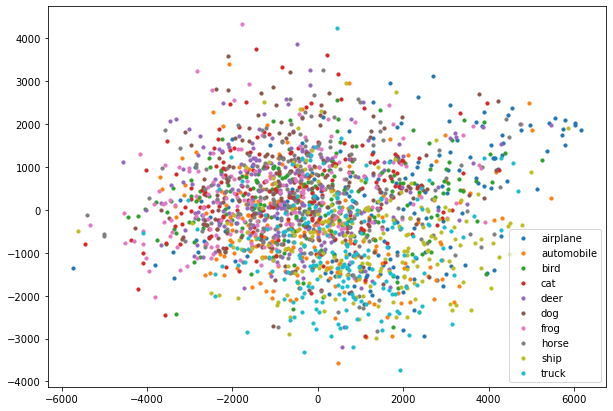

In [11]:
batch_size = 2_000
batch_indices = np.random.choice(len(X_train), batch_size, replace=False)
X_batch = X_train[batch_indices].reshape((-1, 32 * 32 * 3))
batch_labels = y_train[batch_indices]

pca = PCA(n_components=2).fit(X_batch)
X_batch_2d = pca.transform(X_batch)

plt.figure(figsize=(10, 7))

for i, name in class_names.items():
    class_indices = batch_labels == i
    X_class = X_batch_2d[class_indices]
    plt.scatter(X_class[:, 0], X_class[:, 1], s=10, label=name)
    
plt.legend()
plt.show()

Niestety PCA nie pozwoliło uzyskać informacji na temat potencjalnych podobieństw pomiedzy poszczególnymi klasami.

## Wizualizacja zbioru danych przy pomocy t-SNE

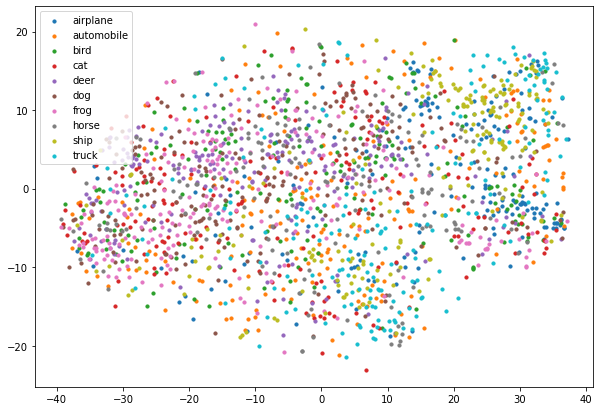

In [12]:
batch_size = 2_000
batch_indices = np.random.choice(len(X_train), batch_size, replace=False)
X_batch = X_train[batch_indices].reshape((-1, 32 * 32 * 3))
batch_labels = y_train[batch_indices]

X_batch_2d = TSNE(n_components=2).fit_transform(X_batch)

plt.figure(figsize=(10, 7))

for i, name in class_names.items():
    class_indices = batch_labels == i
    X_class = X_batch_2d[class_indices]
    plt.scatter(X_class[:, 0], X_class[:, 1], s=10, label=name)
    
plt.legend()
plt.show()

## Analiza confusion matrix dla predykcji na zbiorze testowym

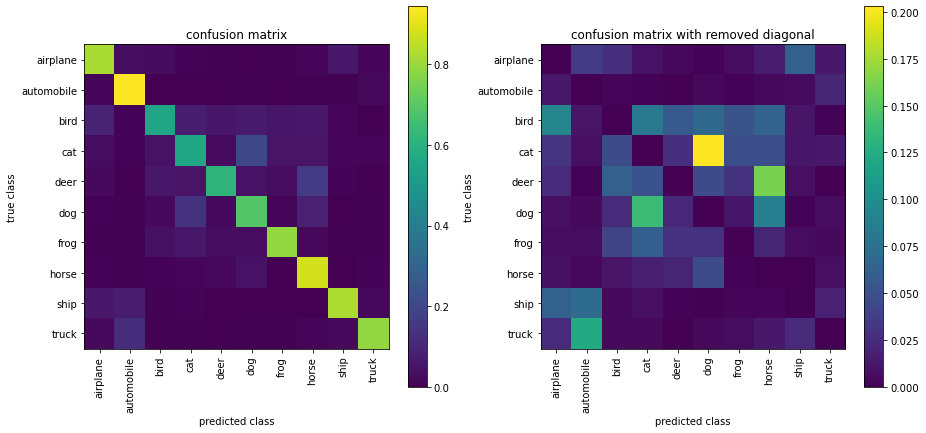

In [13]:
conf_mat = confusion_matrix(y_test, test_preds_classes, normalize='true')

plt.figure(figsize=(15, 7))

plt.subplot(1, 2, 1)
plt.imshow(conf_mat)
labels = list(class_names.values())
plt.xticks(range(10), labels=labels, rotation=90)
plt.yticks(range(10), labels=labels)
plt.xlabel('predicted class')
plt.ylabel('true class')
plt.title('confusion matrix')
plt.colorbar()

plt.subplot(1, 2, 2)
conf_mat_masked = conf_mat.copy()
for i in range(10):
    conf_mat_masked[i, i] = 0
    
plt.imshow(conf_mat_masked)
labels = list(class_names.values())
plt.xticks(range(10), labels=labels, rotation=90)
plt.yticks(range(10), labels=labels)
plt.xlabel('predicted class')
plt.ylabel('true class')
plt.title('confusion matrix with removed diagonal')
plt.colorbar()

plt.show()

Dzięki analizie confusion matrix dochodzimy do wniosku, że model najczęściej myli między sobą zdjęcia następujących klas:
- koty vs psy
- konie vs jelenie
- samochody vs ciężarówki
- ptaki vs samoloty

## Analiza Shap values - porównanie kluczowych obszarów obrazków podobnych klas

W tej części badamy, które obszary zdjęć wejściowych są dla modelu kluczowe w przypadku rozróżnienia podobnych klas. W tym celu wybraliśmy przykłady ze zbioru testowego, które zostały poprawnie zaklasyfikowane przez model, a następnie szukaliśmy na nich charakterystycznych cech wyróżniających daną klasę. Bardzo pomocne przy analizie Shap values okazało się przetworzenie wyników explainera przez filtr z rozmyciem gaussowskim - dzięki niemu heatmapa prezentująca wkład pikseli w predykcje jest zdecydowanie mniej zaszumiona i łatwiejsza do analizy.

In [14]:
def compare_shap(shap_values, explained_classes, imgs):
    np_shap = np.array(shap_values)
    class_labels = [class_names[c] for c in explained_classes]
    classes_shap = np_shap[explained_classes]
    for i, img in enumerate(imgs):
        img_shap = list(classes_shap[:, i:i+1])
        shap.image_plot(img_shap, prep_img(img), np.array([class_labels]))
        
        
def blur_shap_values(shap_values, sigma):
    classes_count = len(shap_values)
    samples_count = shap_values[0].shape[0]
    
    blurred_shap_values = []
    for class_idx in range(classes_count):
        blurred = []
        for sample_idx in range(samples_count):
            blurred.append(gaussian_filter(shap_values[class_idx][sample_idx], sigma=sigma))
        blurred_shap_values.append(blurred)
    return blurred_shap_values

## Analiza Shap values: koty vs psy

In [15]:
cat_class = 3
dog_class = 5

# ręcznie dobrane przykłady
cat_indices = [103, 336, 432, 558, 573, 673, 874]
dog_indices = [39, 42, 181, 190, 207, 232, 319]

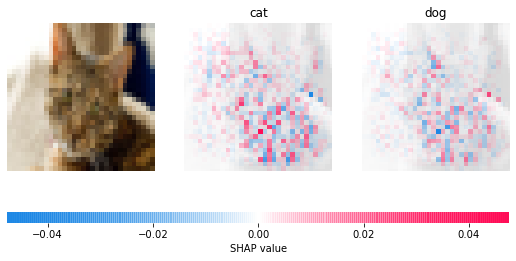

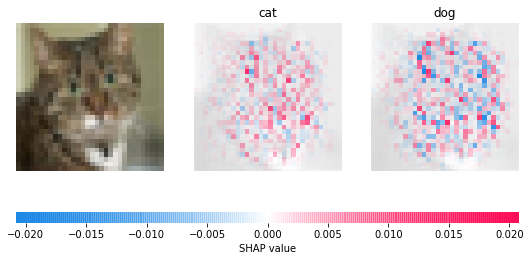

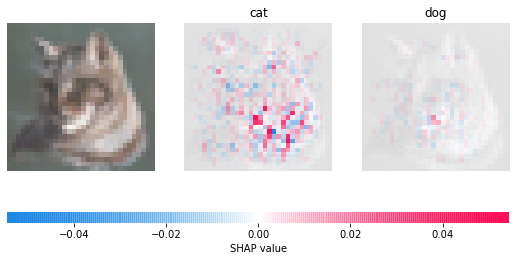

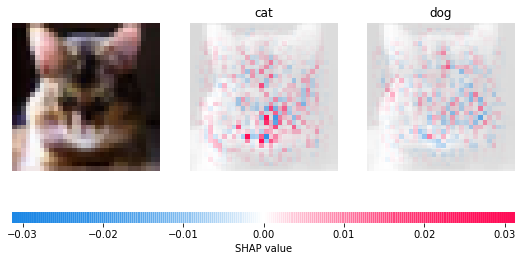

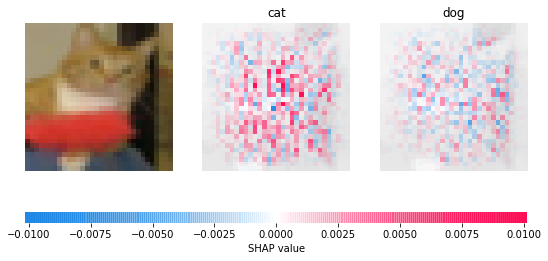

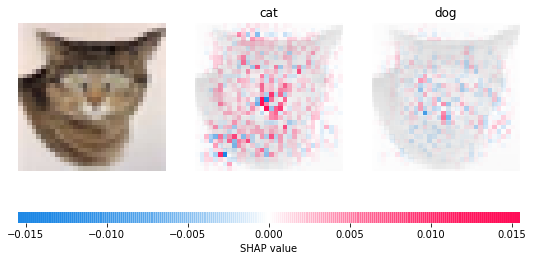

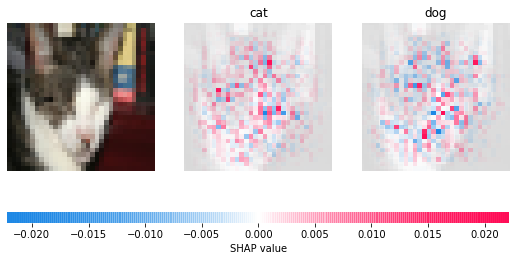

In [16]:
indices = cat_indices
samples = X_test[indices]
samples_prep = X_test_prep[indices]

samples_shap = explainer.shap_values(samples_prep)
compare_shap(samples_shap, [cat_class, dog_class], samples)

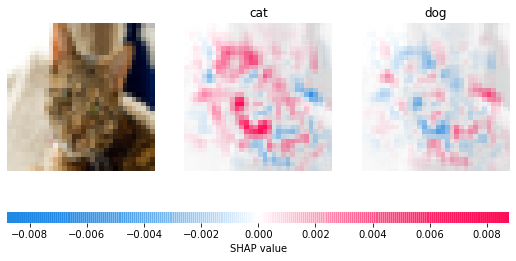

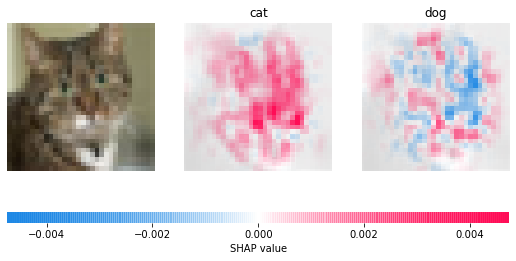

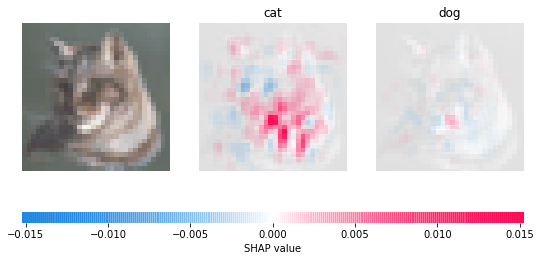

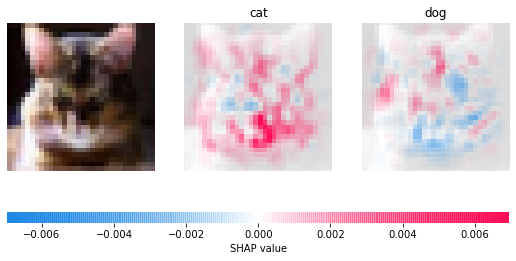

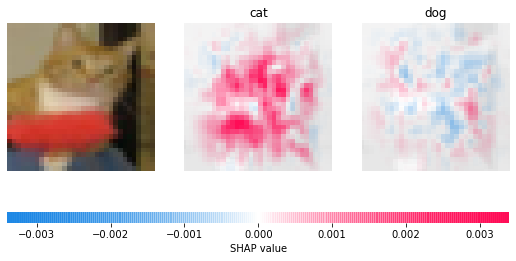

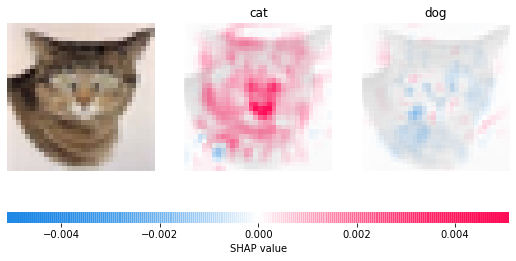

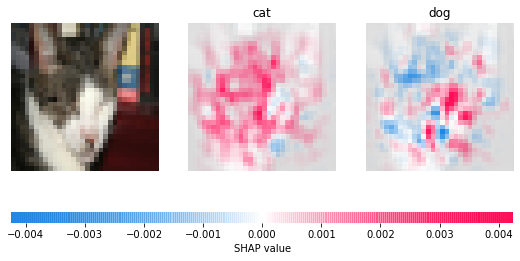

In [17]:
samples_shap_blurred = blur_shap_values(samples_shap, sigma=1)
compare_shap(samples_shap_blurred, [cat_class, dog_class], samples)

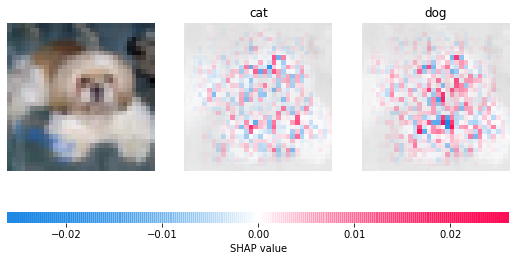

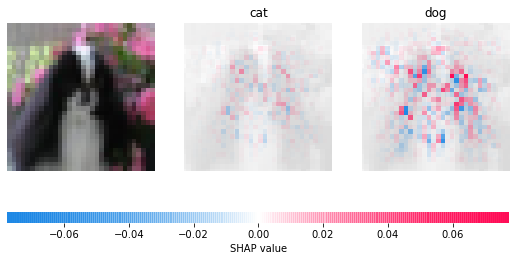

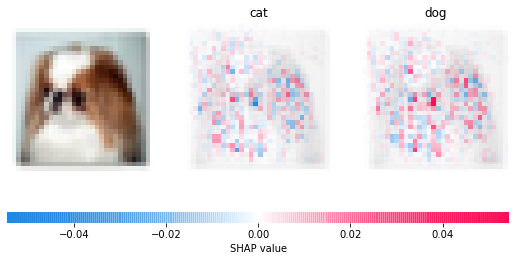

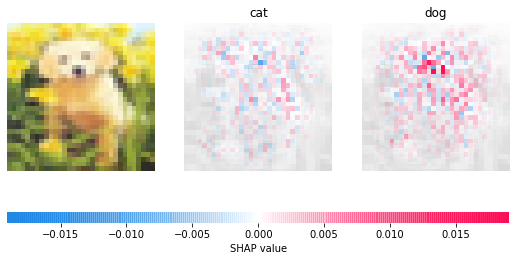

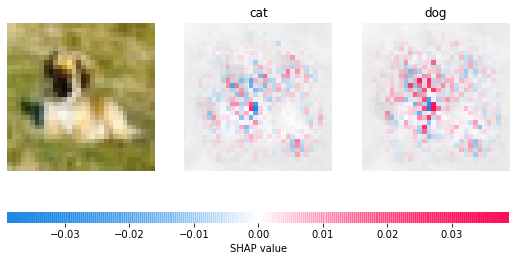

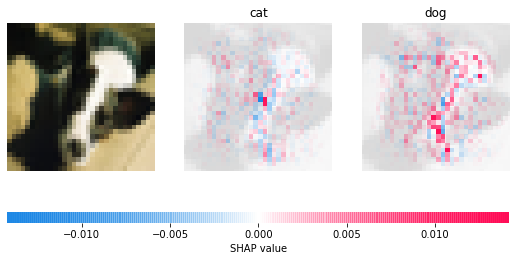

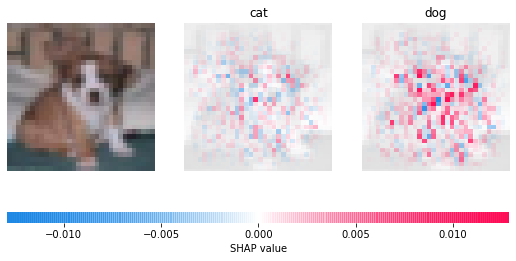

In [18]:
indices = dog_indices
samples = X_test[indices]
samples_prep = X_test_prep[indices]

samples_shap = explainer.shap_values(samples_prep)
compare_shap(samples_shap, [cat_class, dog_class], samples)

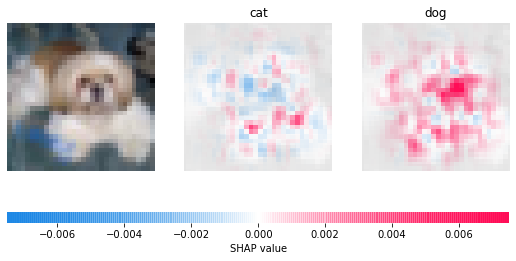

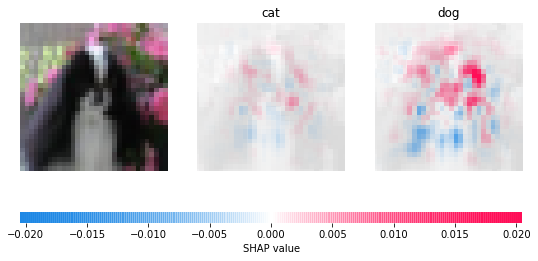

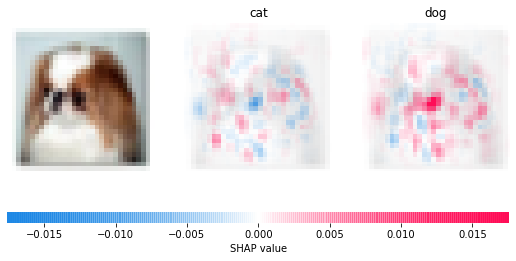

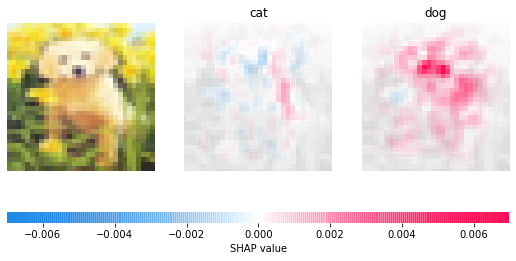

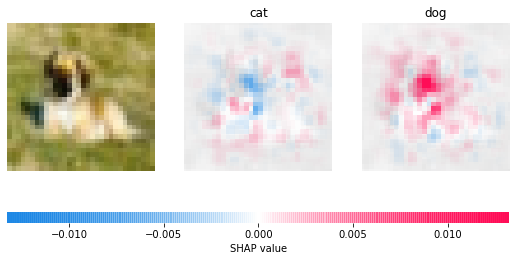

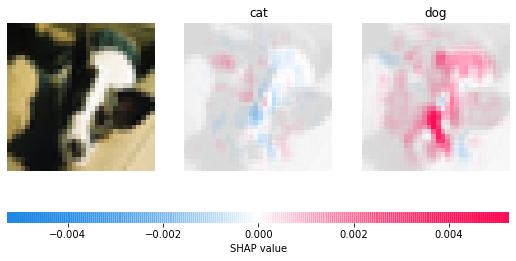

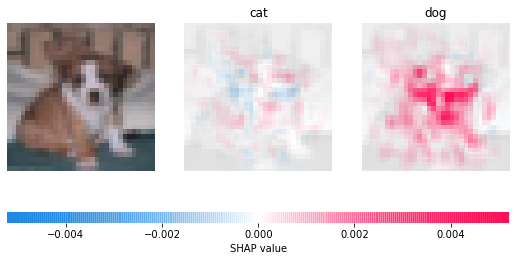

In [19]:
samples_shap_blurred = blur_shap_values(samples_shap, sigma=1)
compare_shap(samples_shap_blurred, [cat_class, dog_class], samples)

Większość zdjęć nie dała czytelnych rezultatów po przetworzeniu przez explainer. Po selekcji próbek, na których dało się zobaczyć obszary decydujące o predykcji modelu, doszliśmy do wniosku, że głównym kryterium, po którym model rozróżnia koty od psów, jest kształt ich pyska. W przypadku kotów często czerwonym kolorem podkreślone są krótkie podbródki i charakterystyczne nosy. W przypadku psów przeważnie obszarem decydującym był cały pysk.

## Analiza Shap values: konie vs jelenie

In [20]:
deer_class = 4
horse_class = 7

# ręcznie dobrane przykłady
deer_indices = [22, 36, 40, 117, 159, 227, 505]
horse_indices = [13, 17, 83, 109, 210, 216, 506]

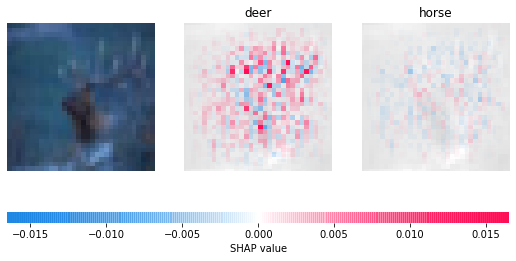

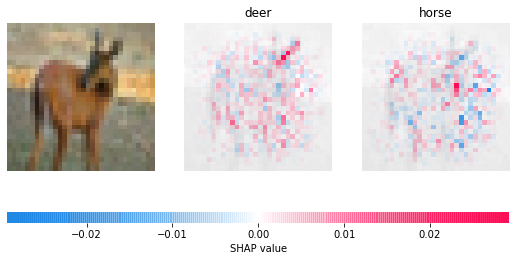

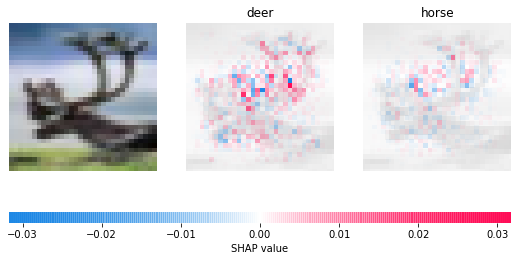

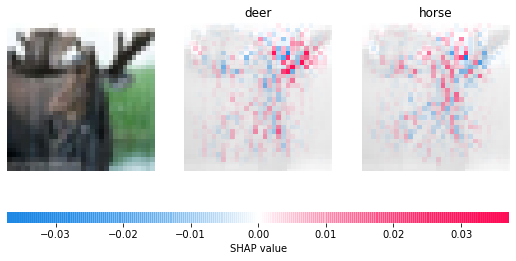

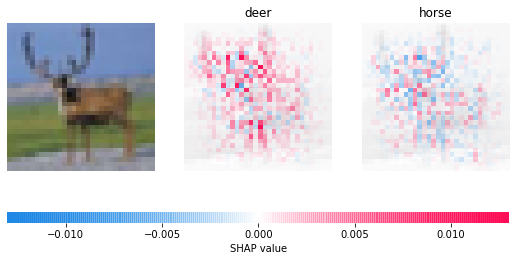

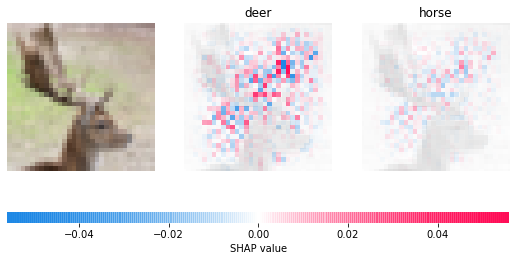

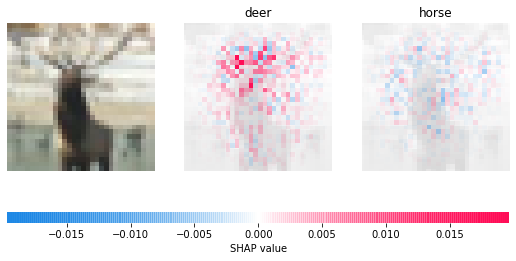

In [21]:
indices = deer_indices
np.random.seed(30)
background = X_train_prep[np.random.choice(X_train_prep.shape[0], 100, replace=False)]
explainer = shap.DeepExplainer(model, background)

samples = X_test[indices]
samples_prep = X_test_prep[indices]

samples_shap = explainer.shap_values(samples_prep)
compare_shap(samples_shap, [deer_class, horse_class], samples)

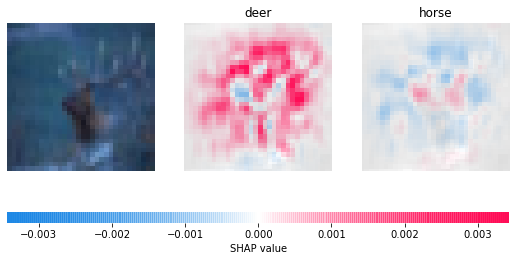

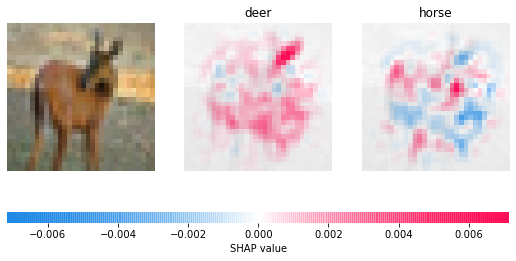

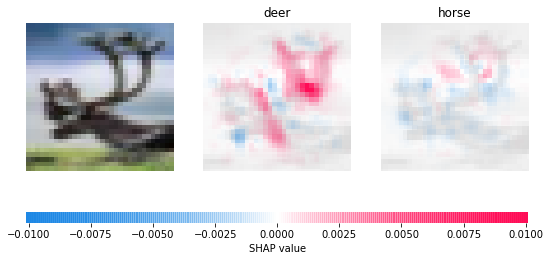

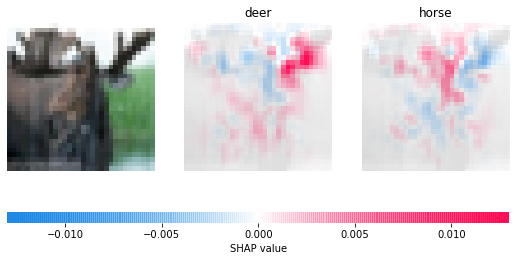

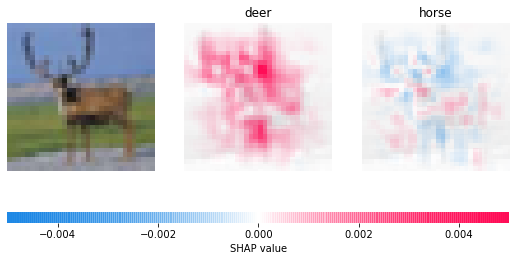

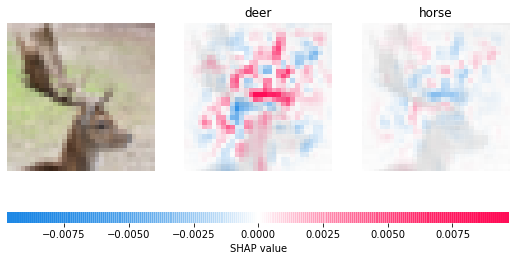

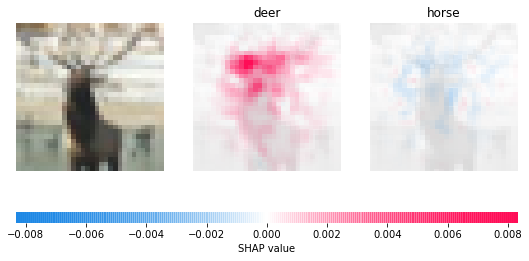

In [22]:
samples_shap_blurred = blur_shap_values(samples_shap, sigma=1)
compare_shap(samples_shap_blurred, [deer_class, horse_class], samples)

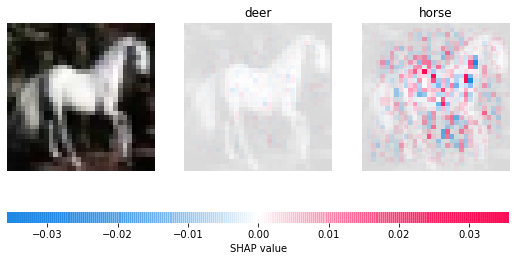

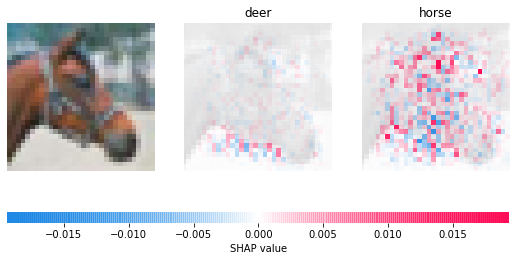

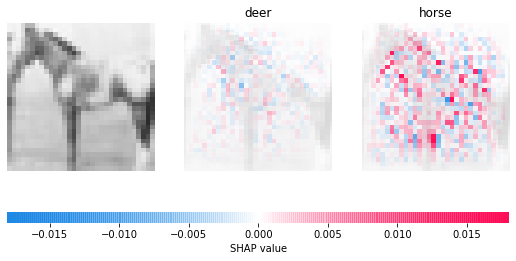

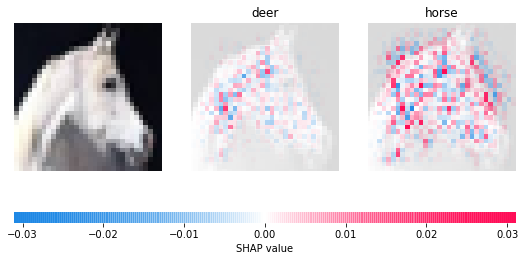

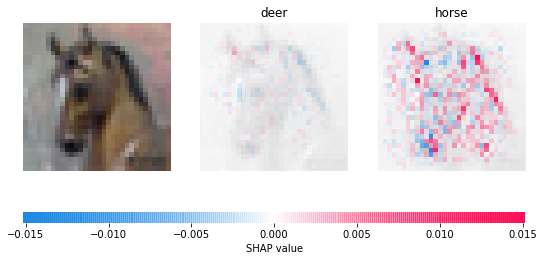

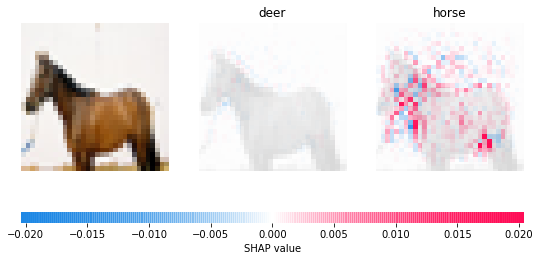

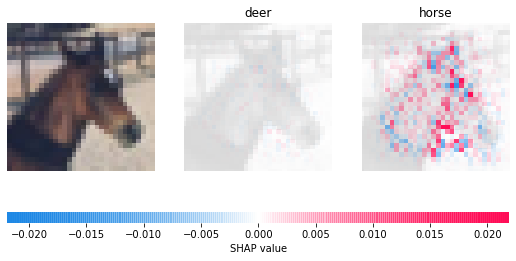

In [23]:
indices = horse_indices
np.random.seed(30)

samples = X_test[indices]
samples_prep = X_test_prep[indices]

samples_shap = explainer.shap_values(samples_prep)
compare_shap(samples_shap, [deer_class, horse_class], samples)

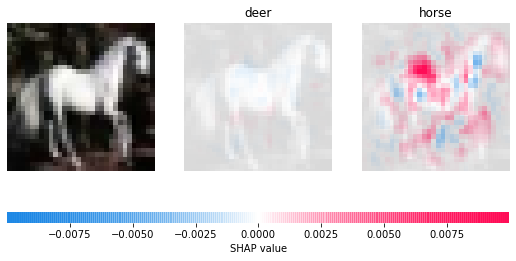

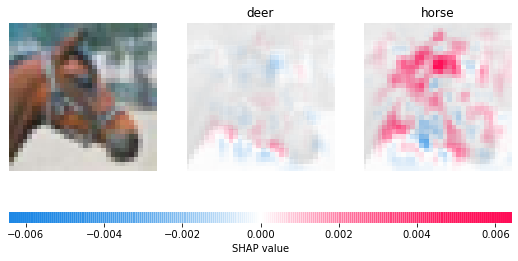

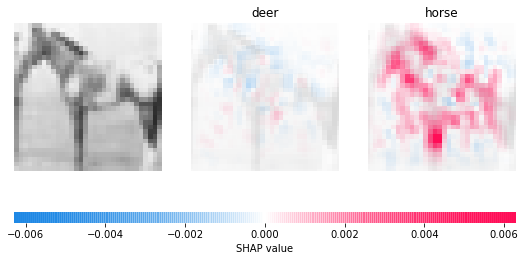

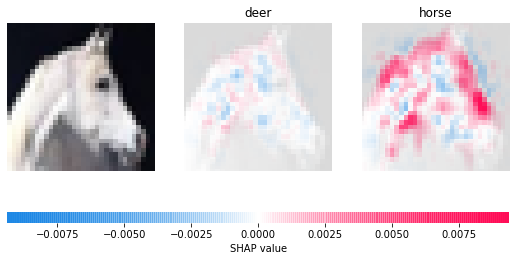

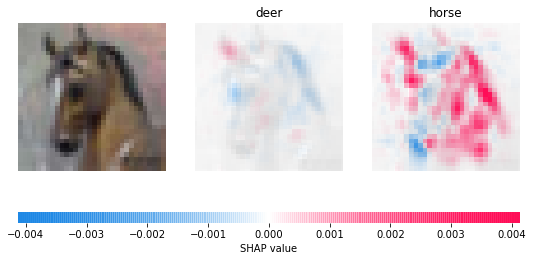

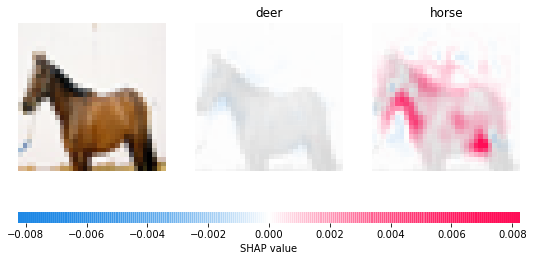

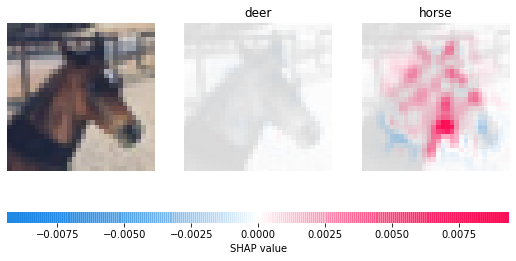

In [24]:
samples_shap_blurred = blur_shap_values(samples_shap, sigma=1)
compare_shap(samples_shap_blurred, [deer_class, horse_class], samples)

Zgodnie z oczekiwaniami, w przypadku rozróżniania jeleni kluczowe jest poroże. Bardzo ładnie jest to widoczne na większości zdjęć, gdy dla klasy jelenia poroże zaznaczone jest intensywnym czerwonym kolorem, natomiast dla klasy konia obszar poroża to kolor mocno niebieski. Ponadto widoczne jest traktowanie smukłej i wysokiej postury jelenia jako jego typowej cechy. Charakterystyczne dla koni w większości przypadków są natomiast grzywy oraz szyje i żuchwa oraz nogi (to ostatnie zwłaszcza ze względu na częste ustawienie koni na zdjęciu od boku). Zdarza się również, że mocnym czerwonym kolorem zaznaczony jest jeździec na koniu.

## Selekcja próbek najłatwiejszych i najtrudniejszych do klasyfikacji

In [25]:
SAMPLES_PER_CLASS = 3

best_samples_indices = []
worst_samples_indices = []

for class_index in range(10):
    class_mask = y_test.flatten() == class_index
    class_preds = test_preds[:, class_index]
    indices = range(len(class_preds))
    
    best_preds_sorted = sorted(zip(class_preds * class_mask, indices), reverse=True)
    best_selected_indices = [i[1] for i in best_preds_sorted]
    best_samples_indices.append(best_selected_indices[:SAMPLES_PER_CLASS])
    
    worst_preds_sorted = sorted(zip((1 - class_preds) * class_mask, indices), reverse=True)
    worst_selected_indices = [i[1] for i in worst_preds_sorted]
    worst_samples_indices.append(worst_selected_indices[:SAMPLES_PER_CLASS])

Próbki sklasyfikowane poprawnie z największą pewnością


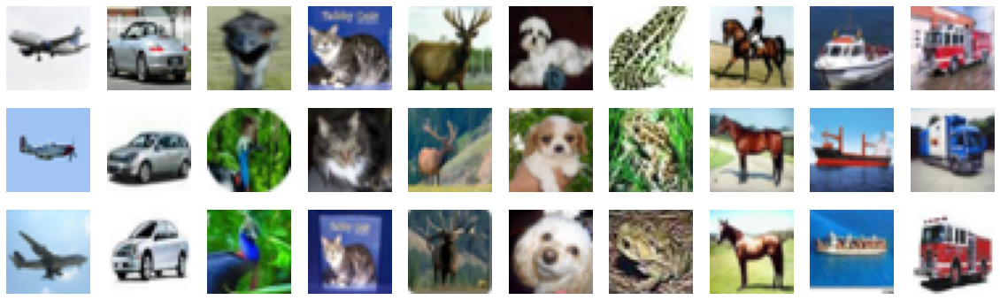

In [26]:
print('Próbki sklasyfikowane poprawnie z największą pewnością')
plt.figure(figsize=(20, 6))
for class_index, img_indices in enumerate(best_samples_indices):
    for sample_index, img_index in enumerate(img_indices):
        plt.subplot(SAMPLES_PER_CLASS, 10, sample_index * 10 + class_index + 1)
        plt.axis('off')
        plt.imshow(X_test[img_index])

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa airplane)


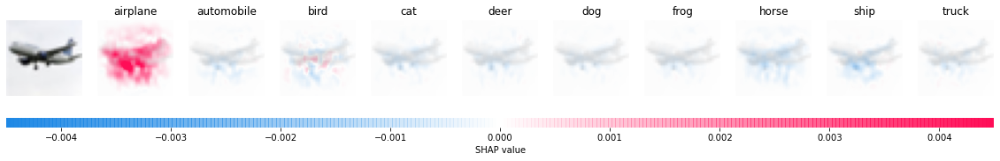

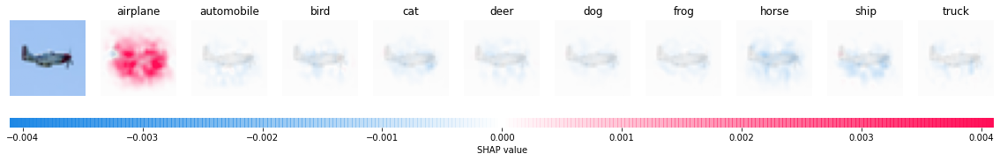

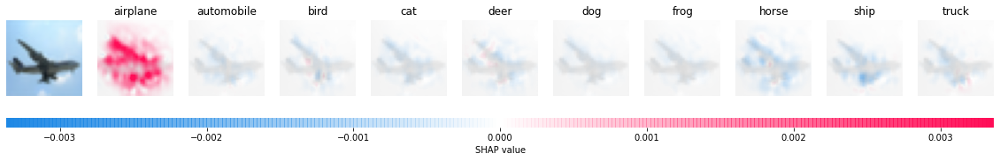

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa automobile)


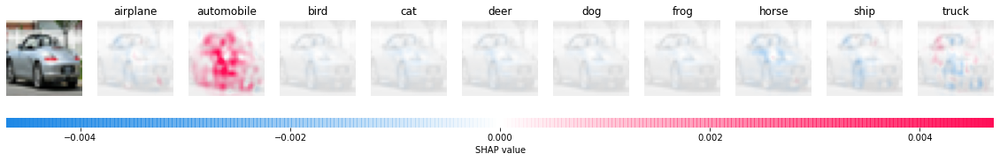

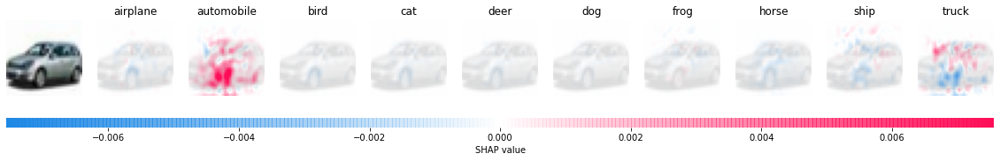

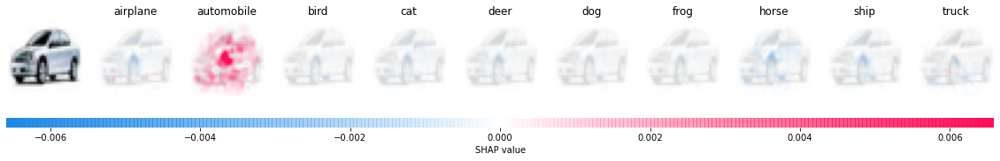

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa bird)


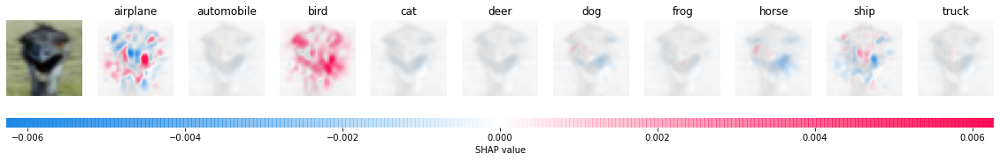

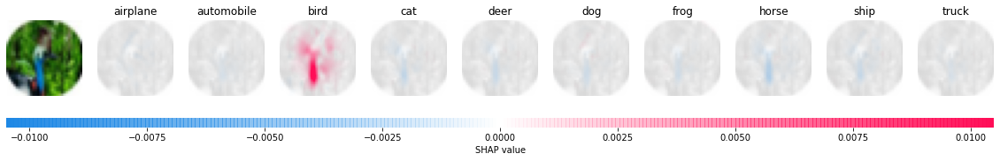

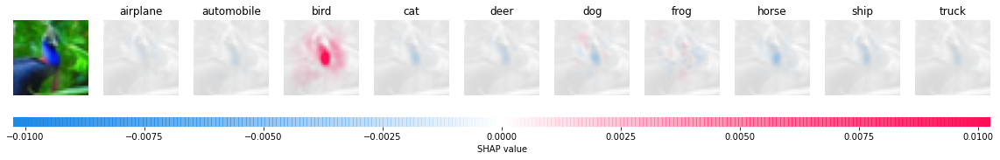

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa cat)


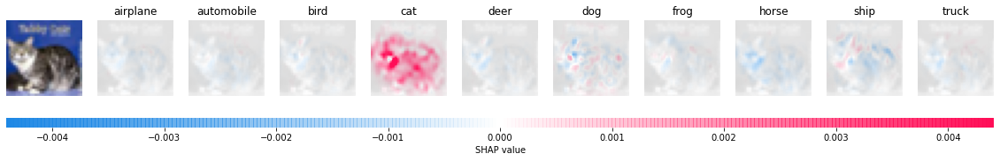

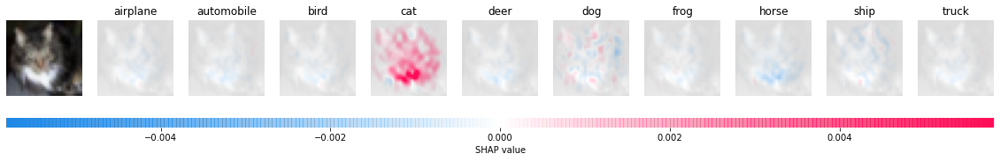

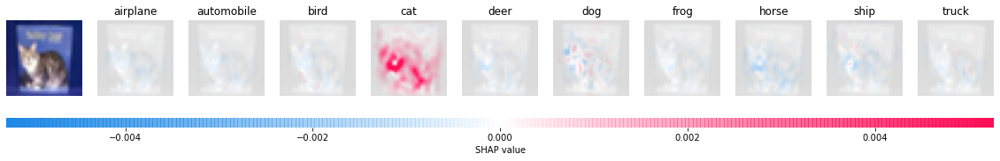

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa deer)


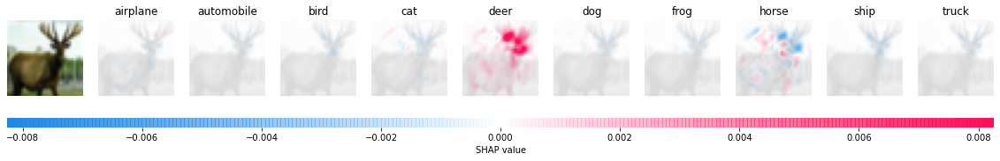

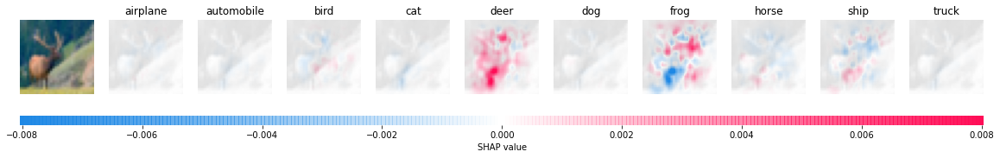

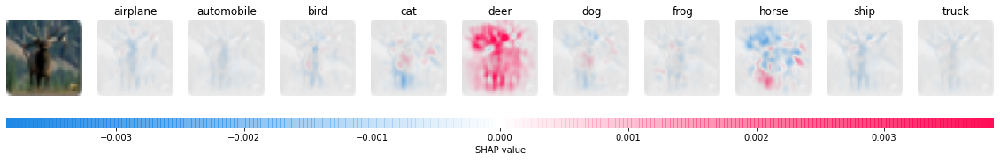

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa dog)


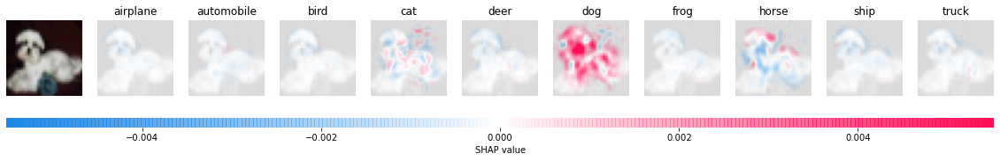

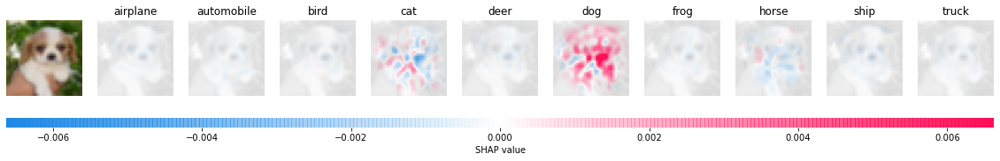

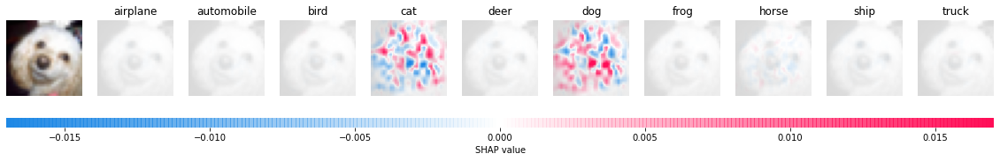

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa frog)


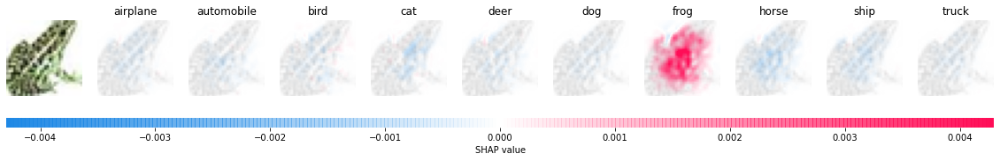

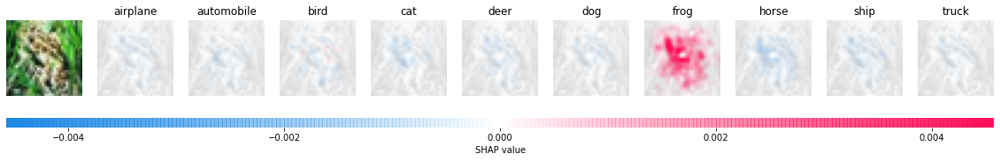

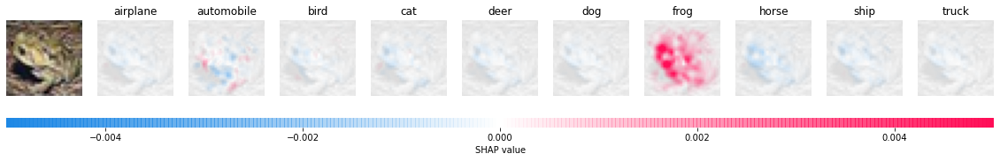

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa horse)


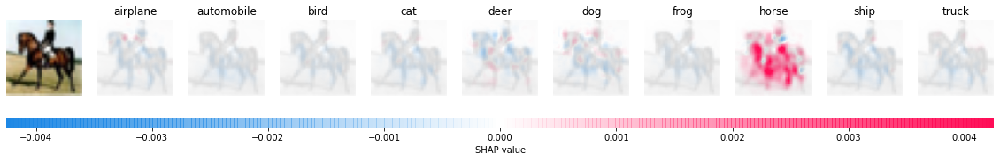

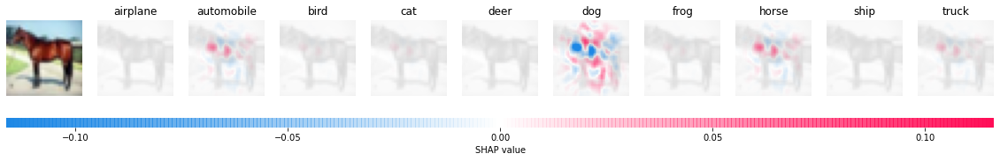

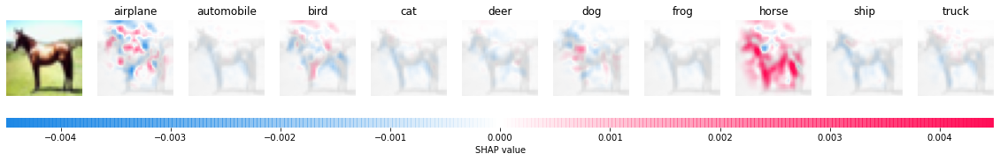

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa ship)


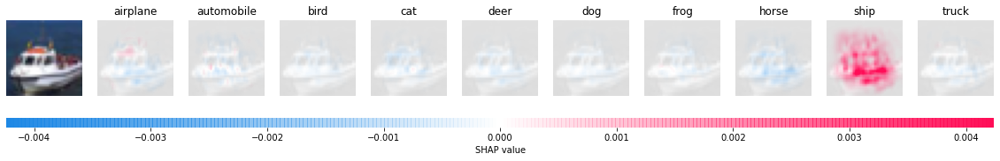

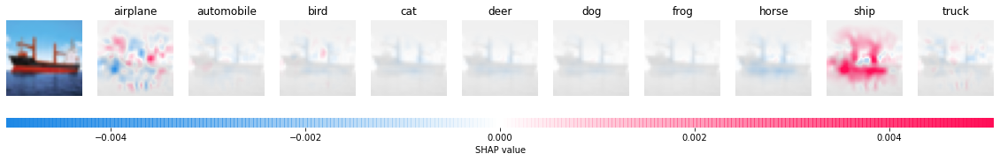

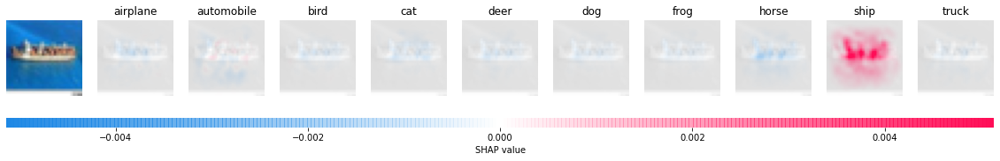

Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa truck)


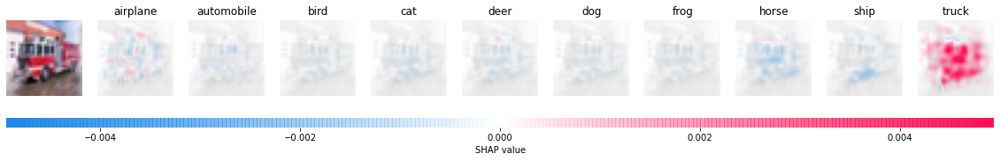

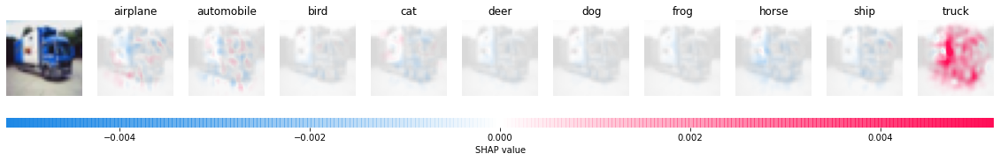

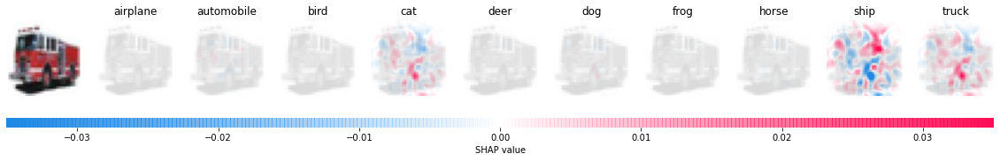

In [27]:
for class_idx, samples_indices in enumerate(best_samples_indices):
    print(f'Explaining dla próbek sklasyfikowanych poprawnie z największą pewnością (klasa {class_names[class_idx]})')
    imgs = X_test[samples_indices]
    imgs_prep = X_test_prep[samples_indices]
    shap_values = explainer.shap_values(imgs_prep)
    shap_values_blurred = blur_shap_values(shap_values, sigma=1)
    
    for i, img in enumerate(imgs):
        shap_values_for_img = list(np.array(shap_values_blurred)[:, i:i+1])
        compare_shap(shap_values_for_img, list(range(10)), np.array([img]))

Próbki sklasyfikowane błędnie z największą pewnością


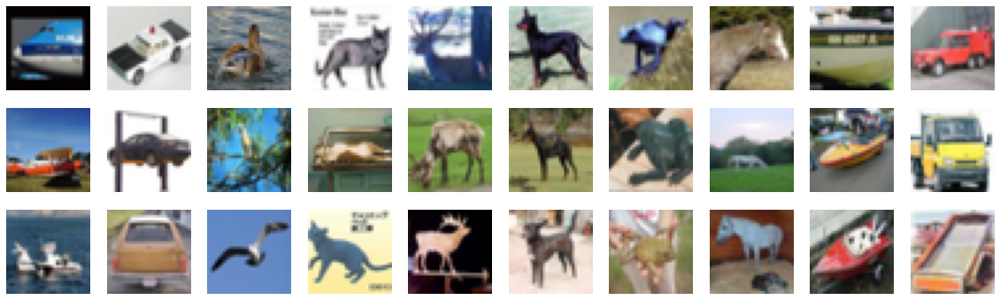

In [28]:
print('Próbki sklasyfikowane błędnie z największą pewnością')
plt.figure(figsize=(20, 6))
for class_index, img_indices in enumerate(worst_samples_indices):
    for sample_index, img_index in enumerate(img_indices):
        plt.subplot(SAMPLES_PER_CLASS, 10, sample_index * 10 + class_index + 1)
        plt.axis('off')
        plt.imshow(X_test[img_index])

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa airplane)


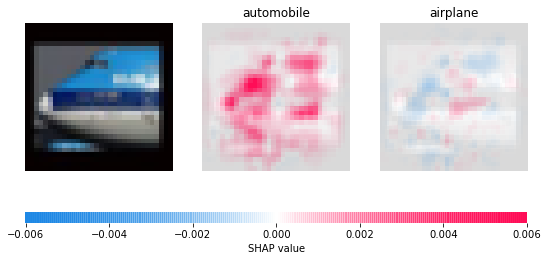

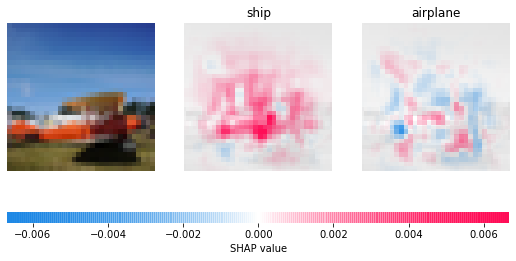

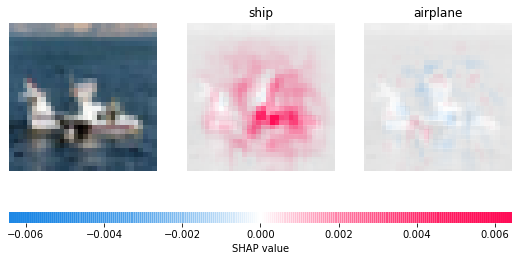

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa automobile)


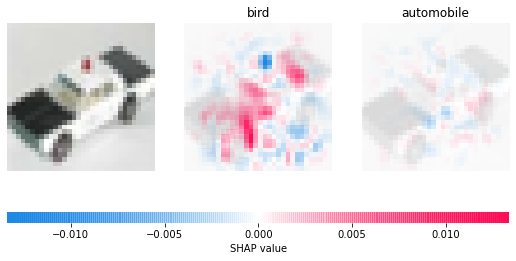

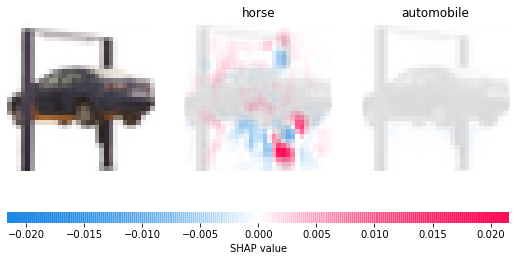

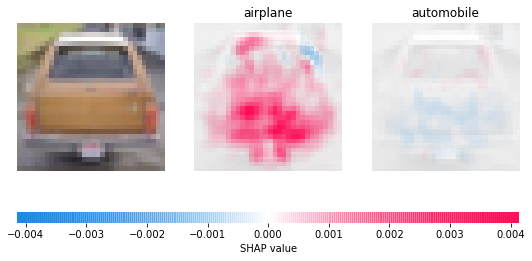

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa bird)


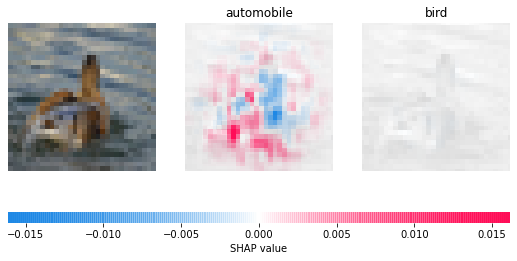

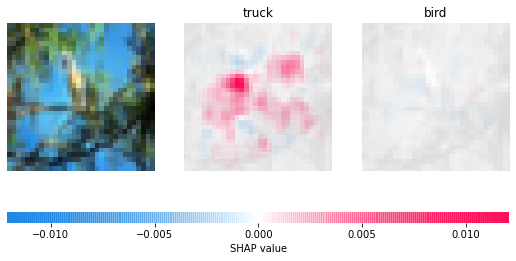

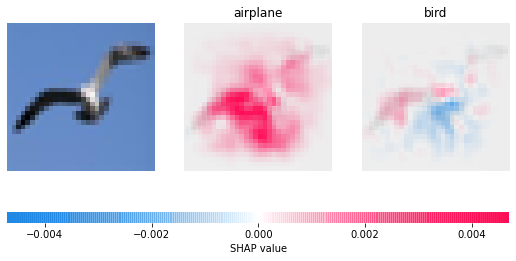

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa cat)


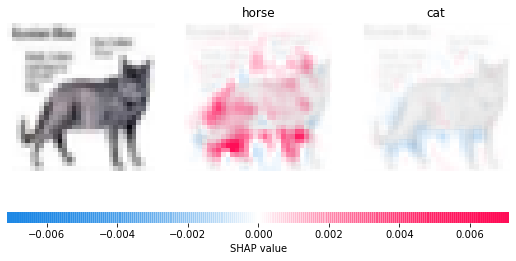

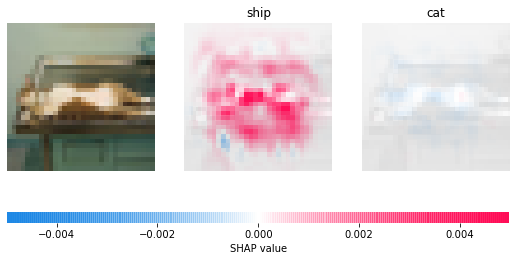

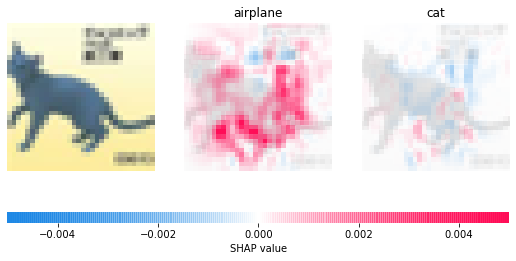

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa deer)


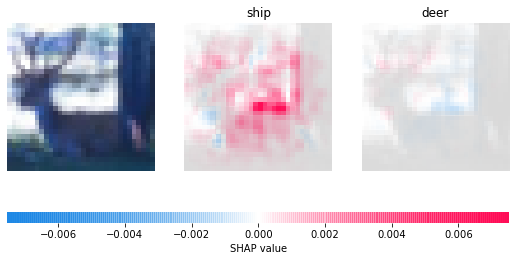

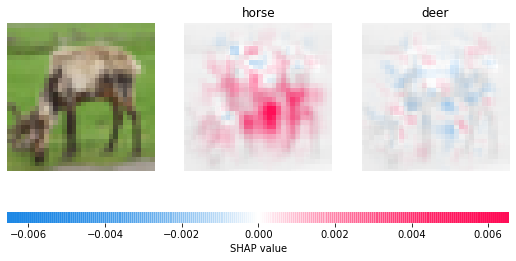

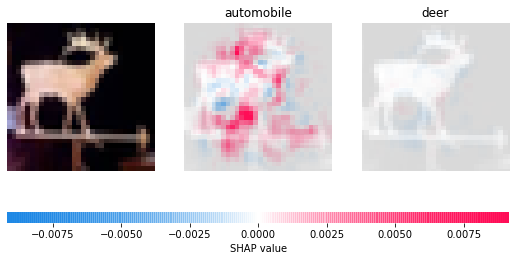

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa dog)


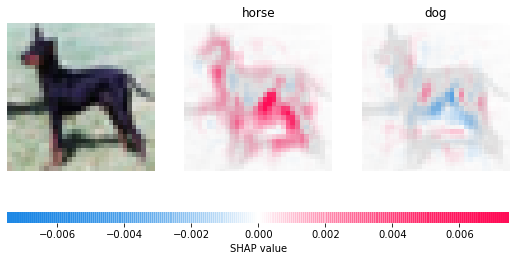

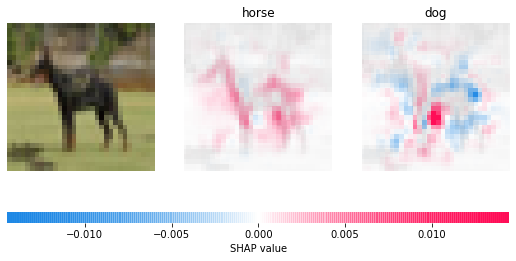

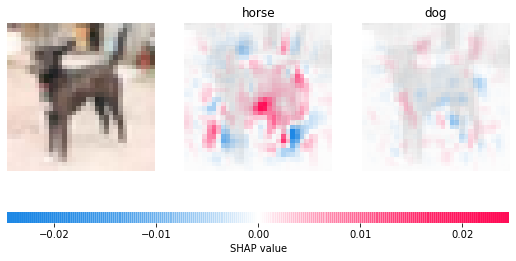

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa frog)


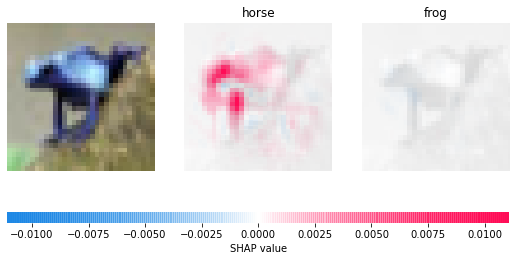

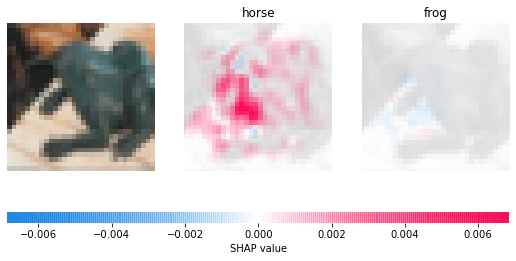

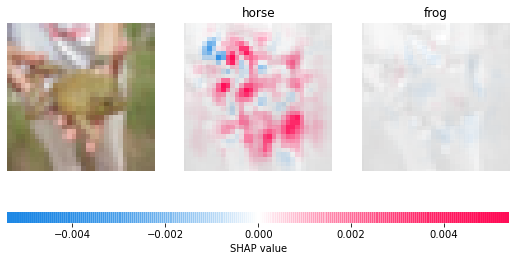

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa horse)


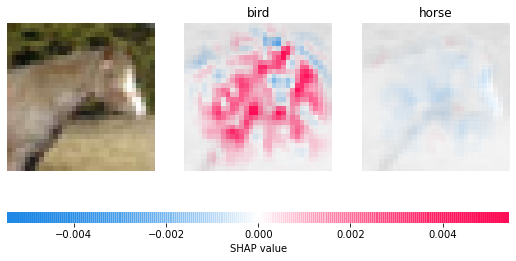

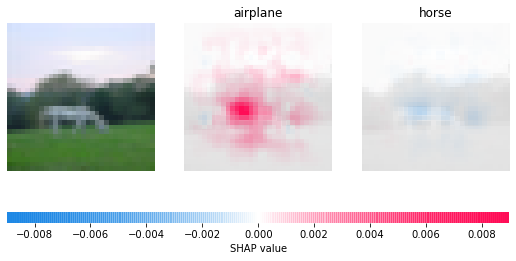

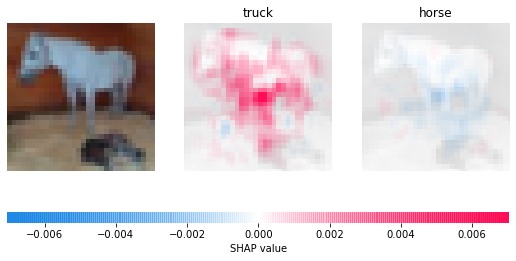

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa ship)


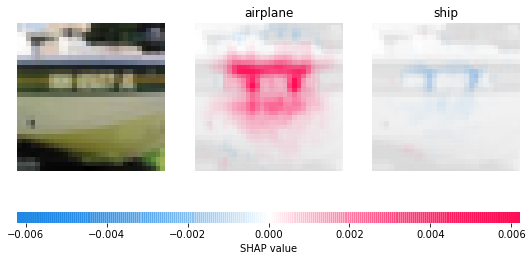

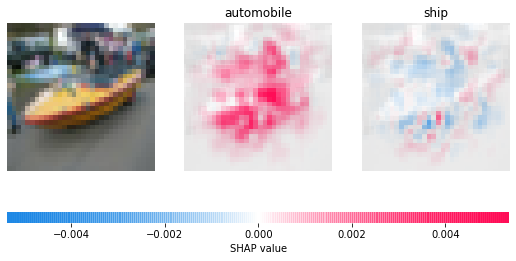

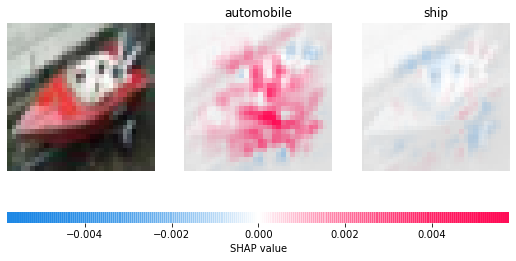

Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa truck)


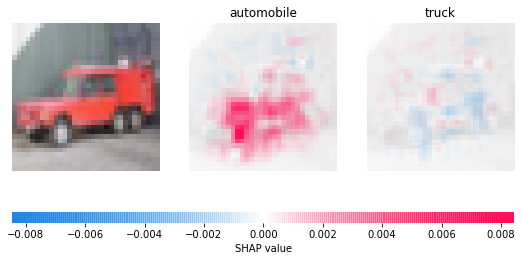

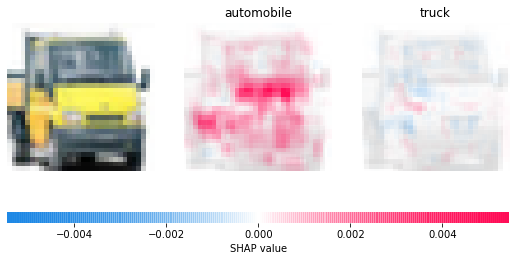

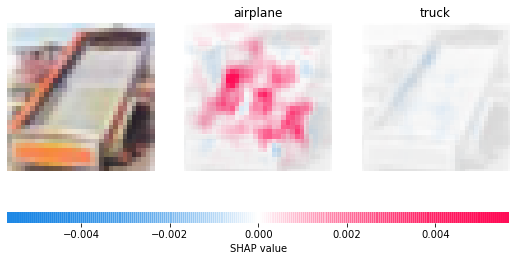

In [29]:
for class_idx, samples_indices in enumerate(worst_samples_indices):
    print(f'Explaining dla próbek sklasyfikowanych błędnie z największą pewnością (klasa {class_names[class_idx]})')
    imgs = X_test[samples_indices]
    imgs_prep = X_test_prep[samples_indices]
    true_labels = y_test[samples_indices]
    pred_labels = test_preds_classes[samples_indices]
            
    shap_values = explainer.shap_values(imgs_prep)
    shap_values_blurred = blur_shap_values(shap_values, sigma=1)
    
    for i, (img, true_label, pred_label) in enumerate(zip(imgs, true_labels, pred_labels)):
        shap_values_for_img = list(np.array(shap_values_blurred)[:, i:i+1])
        compare_shap(shap_values_for_img, [pred_label, true_label], np.array([img]))

## Selekcja próbek, dla których predykcja modelu jest wyrównana dla dwóch klas

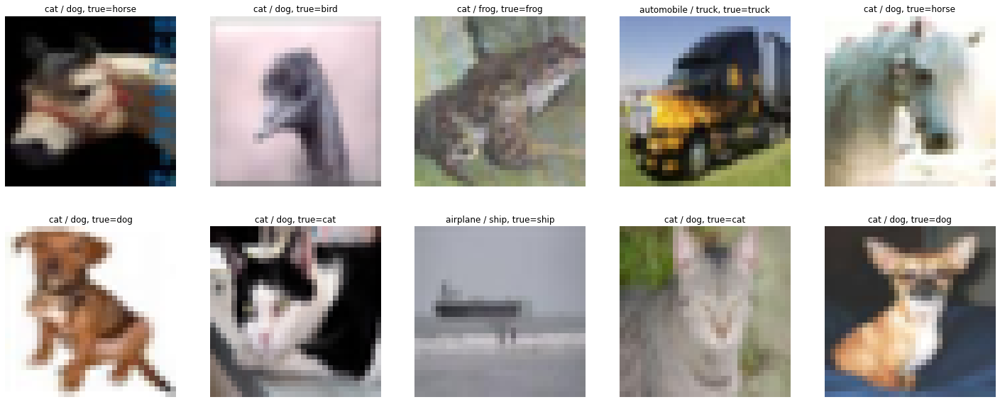

In [30]:
CONFUSING_SAMPLES_COUNT = 10
CONFIDENCE_THRESHOLD = 0.4

preds_above_threshold = test_preds > CONFIDENCE_THRESHOLD
confusing_preds_mask = np.sum(preds_above_threshold, axis=-1) > 1
confusing_samples_indices = np.argwhere(confusing_preds_mask)[:CONFUSING_SAMPLES_COUNT].flatten()
confusing_samples_preds = [np.argwhere(preds_above_threshold[i]).flatten() for i in confusing_samples_indices]

plt.figure(figsize=(25, 10))
for i, (sample_index, sample_preds) in enumerate(zip(confusing_samples_indices, confusing_samples_preds)):
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_test[sample_index])
    true_label = class_names[y_test[sample_index]]
    plt.title(f'{class_names[sample_preds[0]]} / {class_names[sample_preds[1]]}, true={true_label}')
    plt.axis('off')

Przewidziane klasy cat, dog
Rzeczywista klasa horse


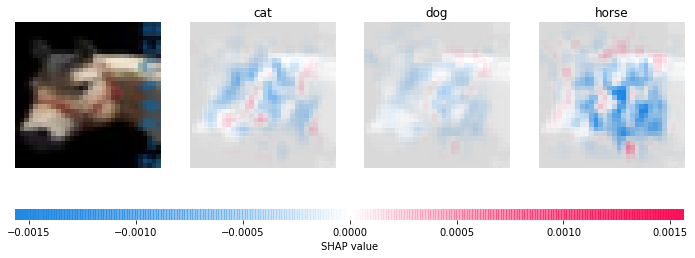

Przewidziane klasy cat, dog
Rzeczywista klasa bird


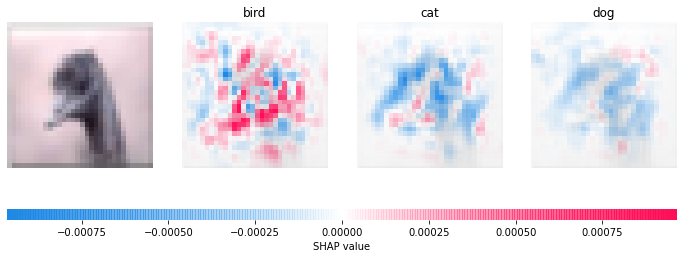

Przewidziane klasy cat, frog
Rzeczywista klasa frog


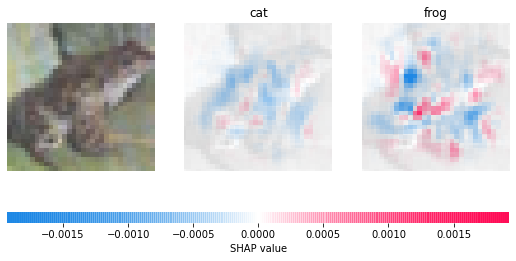

Przewidziane klasy automobile, truck
Rzeczywista klasa truck


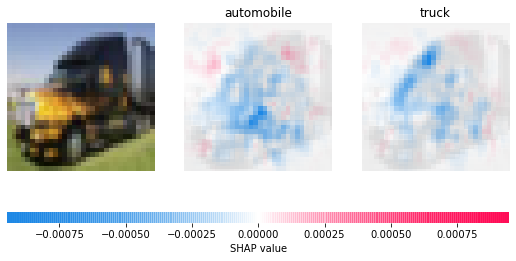

Przewidziane klasy cat, dog
Rzeczywista klasa horse


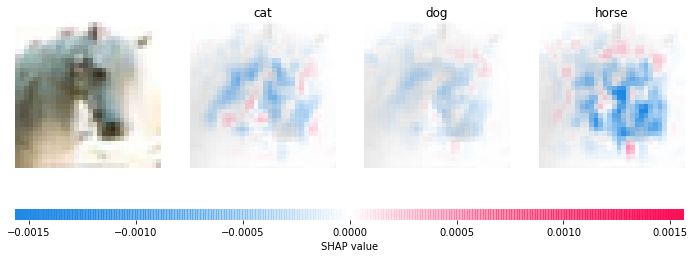

Przewidziane klasy cat, dog
Rzeczywista klasa dog


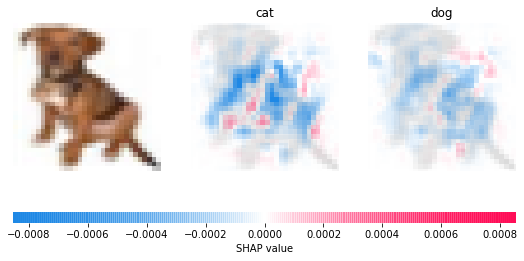

Przewidziane klasy cat, dog
Rzeczywista klasa cat


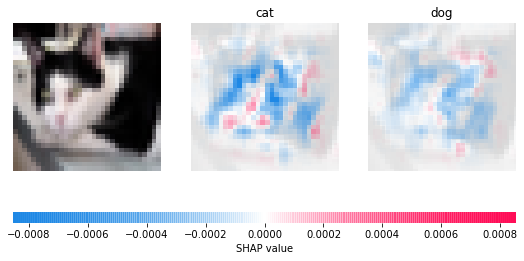

Przewidziane klasy airplane, ship
Rzeczywista klasa ship


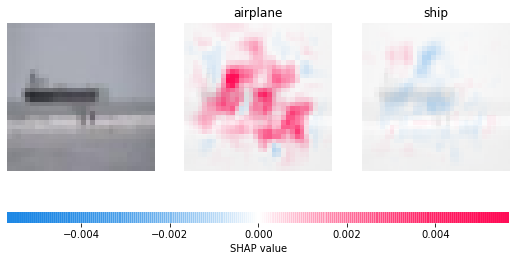

Przewidziane klasy cat, dog
Rzeczywista klasa cat


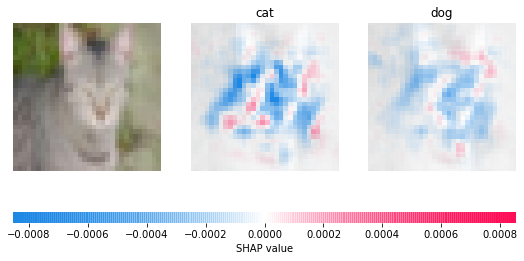

Przewidziane klasy cat, dog
Rzeczywista klasa dog


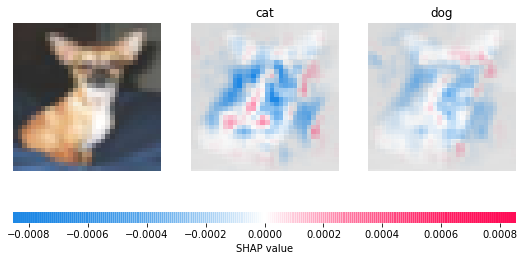

In [31]:
for sample_index, predicted_classes in zip(confusing_samples_indices, confusing_samples_preds):
    img = X_test[sample_index]
    img_prep = X_test_prep[sample_index]
    true_label = y_test[sample_index]
    print(f'Przewidziane klasy {class_names[predicted_classes[0]]}, {class_names[predicted_classes[1]]}')
    print(f'Rzeczywista klasa {class_names[true_label]}')
        
    shap_values = explainer.shap_values(np.array([img_prep]))
    shap_values_blurred = blur_shap_values(shap_values, sigma=1)
    explained_classes = np.unique(list(predicted_classes) + [true_label])
    compare_shap(shap_values_for_img, explained_classes, np.array([img]))

## Analiza otrzymanych wyjaśnień dla różnych backgroudów

airplane:    	0.0
automobile:    	0.0
bird:    	0.001
cat:    	0.001
deer:    	0.0
dog:    	0.0
frog:    	0.997
horse:    	0.0
ship:    	0.0
truck:    	0.0


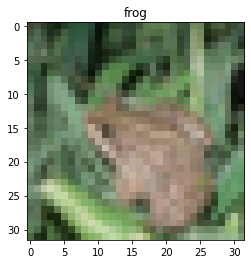

In [32]:
sample_idx = 4
sample_img = X_test[sample_idx]
sample_img_prep = X_test_prep[sample_idx]

sample_label = y_test[sample_idx]
sample_pred = test_preds[sample_idx]

for i in range(10):
    rounded_pred = str(sample_pred[i].round(3))
    print(f'{class_names[i]}:    \t{rounded_pred}')
    
plt.imshow(sample_img)
plt.title(class_names[sample_label])
plt.show()

In [36]:
%%time
np.random.seed(20)

backgrounds = {
    '10 random samples': X_train_prep[np.random.choice(X_train_prep.shape[0], 10, replace=False)],
    '100 random samples': X_train_prep[np.random.choice(X_train_prep.shape[0], 100, replace=False)],
    '1000 random samples': X_train_prep[np.random.choice(X_train_prep.shape[0], 1000, replace=False)],
    'Blank black image': np.zeros((1, *X_train_prep[0].shape)),
    'Blank white image': np.ones((1, *X_train_prep[0].shape)),
    'Mean of training set': np.mean(X_train_prep, axis=0, keepdims=True),
    'Median of training set': np.median(X_train_prep, axis=0, keepdims=True),
    'Geometric mean of training set': preprocess_input(gmean(X_train, axis=0)[np.newaxis, :]),
    'Harmonic mean of training set': preprocess_input(hmean(X_train, axis=0)[np.newaxis, :]),
    '100 samples of the same class': X_train_prep[np.random.choice(np.argwhere(y_train==sample_label).flatten(), 100, replace=False)],
    '100 samples of wrong classes': X_train_prep[np.random.choice(np.argwhere(y_train!=sample_label).flatten(), 100, replace=False)],
    '100 samples of single wrong class (ships)': X_train_prep[np.random.choice(np.argwhere(y_train==8).flatten(), 100, replace=False)],
}

CPU times: user 16.2 s, sys: 535 ms, total: 16.8 s
Wall time: 16.7 s


10 random samples background:


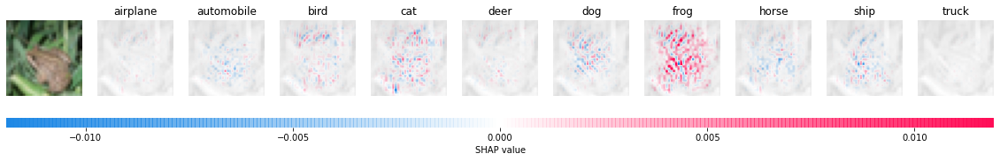

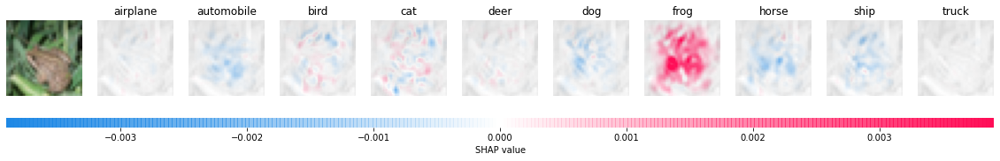

100 random samples background:


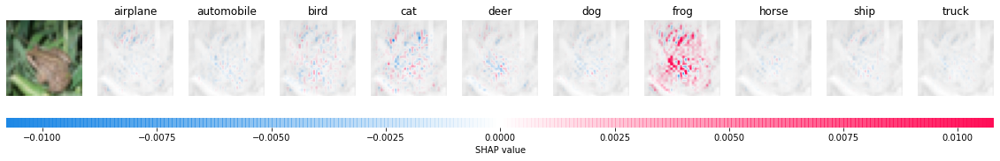

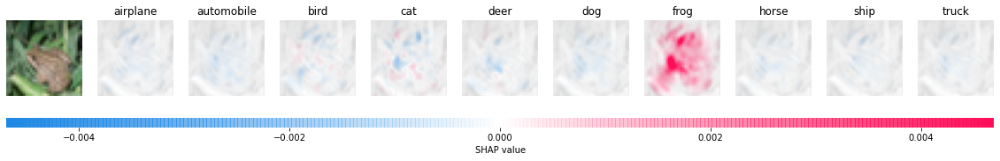

1000 random samples background:


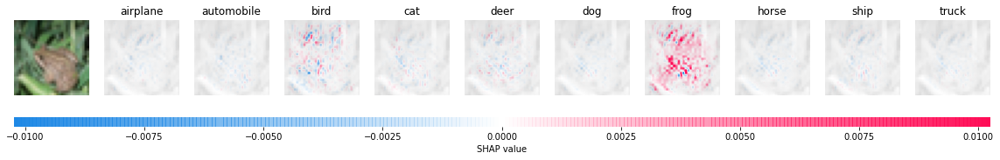

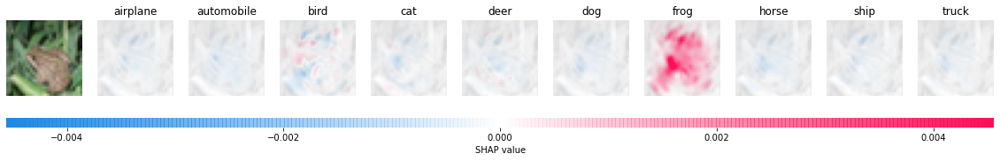

Blank black image background:

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



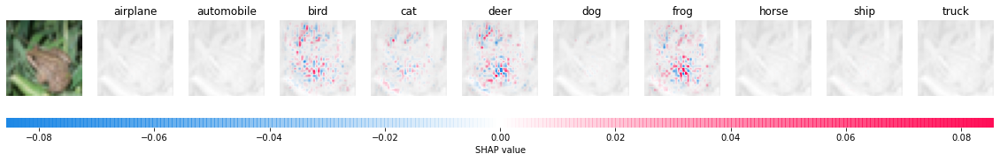

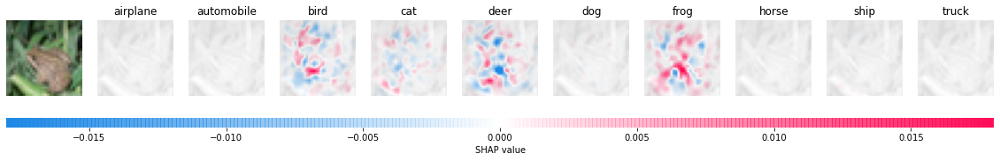

Blank white image background:


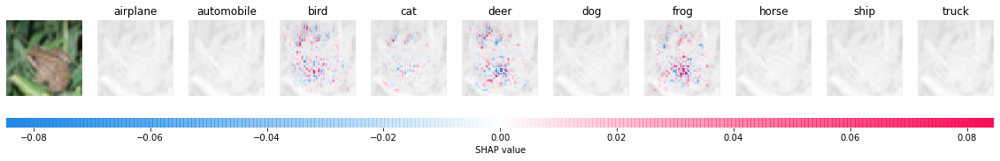

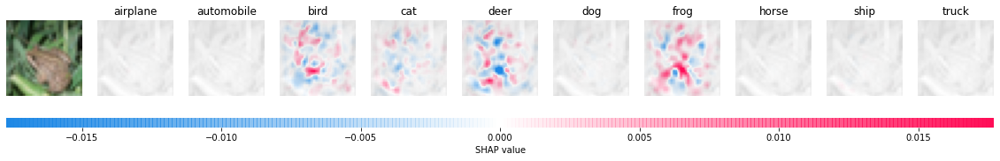

Mean of training set background:


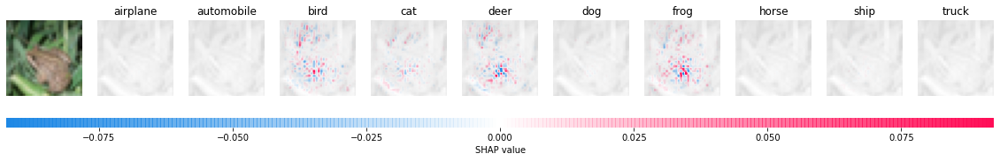

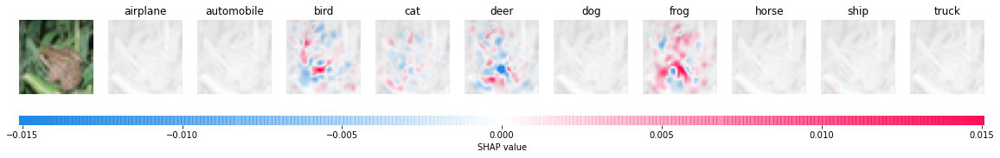

Median of training set background:


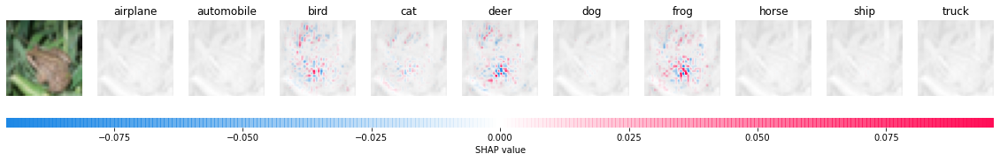

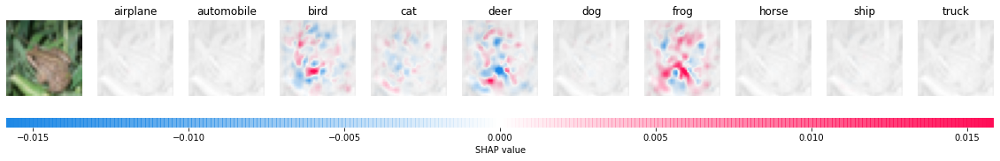

Geometric mean of training set background:


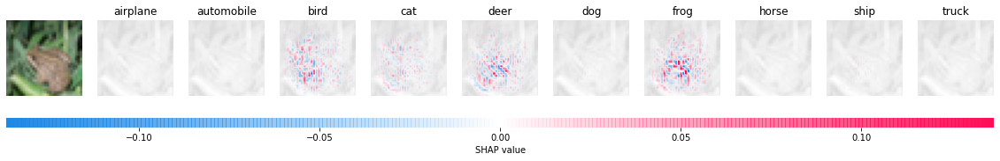

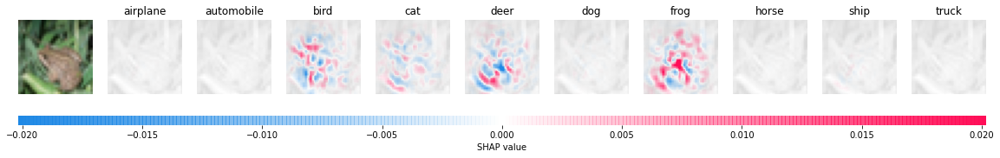

Harmonic mean of training set background:


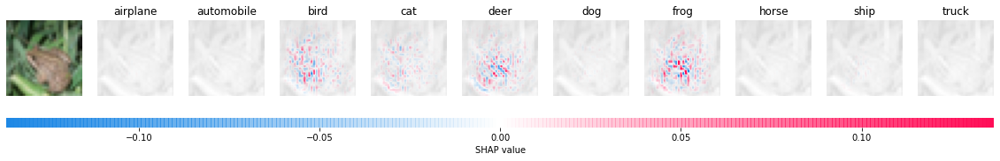

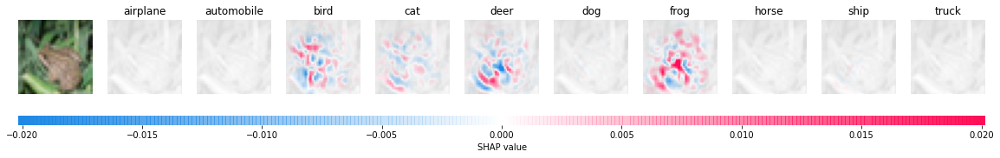

100 samples of the same class background:


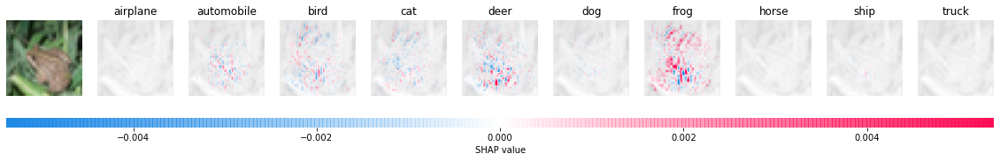

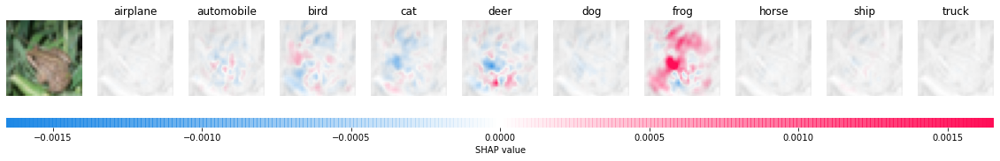

100 samples of wrong classes background:


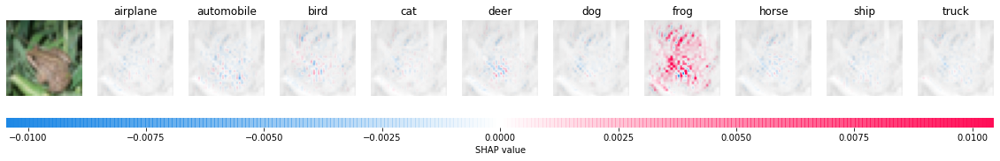

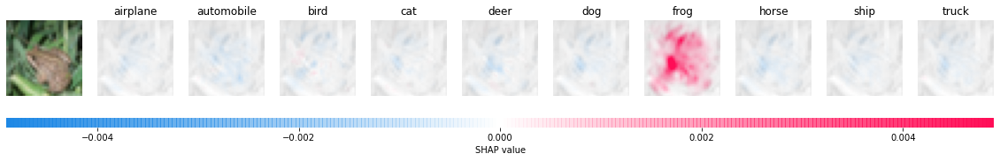

100 samples of single wrong class (ships) background:


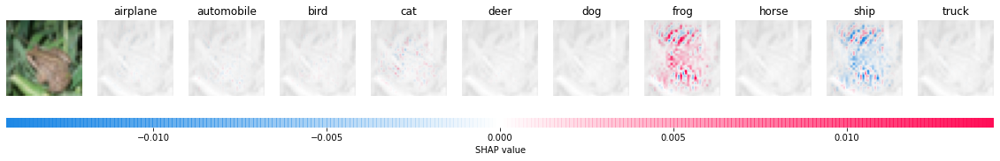

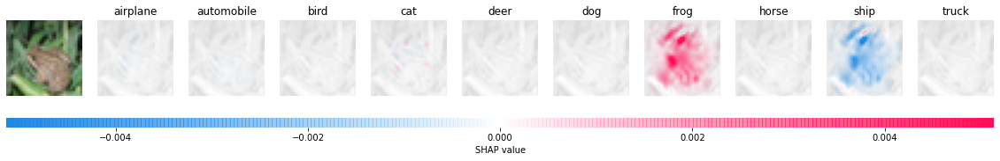

CPU times: user 8min 25s, sys: 4min 32s, total: 12min 57s
Wall time: 3min 34s


In [37]:
%%time
image_batch = sample_img_prep[np.newaxis, :]

for background_name, background in backgrounds.items():
    print(f'{background_name} background:')
    explainer = shap.DeepExplainer(model, background)
    sample_img_shap = explainer.shap_values(image_batch)
    compare_shap(sample_img_shap, list(range(10)), [sample_img])
    compare_shap(blur_shap_values(sample_img_shap, 1), list(range(10)), [sample_img])

Interpretacja wyników dla różnych backgroudnów:

- Najbardziej naturalne i zrównoważone wyniki udało się uzyskać dla wykorzystania samplowania części zbioru treningowego, w tym przypadku wykorzystanie większej liczby sampli pozwoliło precyzyjniej zaznaczać fragmenty obrazu wpływające na klasyfikację
- Wykorzystanie czarnego i białego gładkiego obrazu skutkuje uzyskaniem takich samych wyników, ze względu na brak wyraźnego tła w wybranej próbce. Uzyskane wyniki lepiej pokazują fragmenty obrazu wpływające na wynik klasyfikacji jako złe klasy
- Średnia oraz mediana pozwoliły uzyskać bardzo podobne wyniki, analogiczne do zastosowania gładkich obrazów
- Średnia geometryczna zwróciła bardzo analogiczne wyniki, ale bardziej podkreślające fragmenty obrazu rzeczywiście przedstawiające żabę, a mniej fragmenty tła
- Zastosowanie średniej harmonicznej pozwoliło uzyskać wyniki analogiczne do tych ze średnią geometryczną
- Zastosowanie jako tła próbek przedstawiających jedynie próbki tej samej klasy co wyjaśniany obraz pozwoliło zaznaczyć najbardziej charaktrerystyczne dla klasy fragmenty obrazu (głowa żaby, liście w tle) oraz najbardziej niepasujące do innych zdjęć żab (położenie w dolnej części obrazu)
- Zastosowanie jako tła próbek innych klas pozwoliło znaleźć fragmenty obrazu negatywnie wpływające na klasyfikację jako inne klasy, ale spowodowało uzyskanie praktycznie całego czerwonego wyjaśnienia obrazu dla klasy poprawnej
- Zastosowanie jako tła próbek konkretnej innej klasy, w tym przypadku statków, pozwoliło uzyskać wyznaczenie fragmentów obrazu nie pasujących do klasy statek oraz drobnych fragmentów, które mogłyby być tak interpretowane

Podsumowując do ogólnego użytku najlepiej zastosować możliwie największy podzbiór zbioru treningowego jako tło. W przypadku gdy szukamy różnic pomiędzy dwoma konkretnymi klasami dobrze działa zastosowanie backgroudu z obrazami tyko dobrej, tylko złej lub tylko dwóch porównywanych klas. W końcu jeśli interesuje nas znalezienie fragmentów bardziej wpływających na zwiększanie i zmniejszanie confidence modelu dla błędnych klas warto zastosować background będący jedną z dostępnych średnich zbioru treningowego.